<a href="https://colab.research.google.com/github/nayana142/Deep-Learning-CNN/blob/main/Ninjacart.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import tensorflow as tf

In [ ]:
!gdown https://drive.google.com/file/d/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

/usr/local/lib/python3.10/dist-packages/gdown/parse_url.py:35: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=None
  warnings.warn(
Downloading...
From: https://drive.google.com/file/d/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
To: /content/1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
84.8kB [00:00, 46.3MB/s]


In [ ]:
!ls

1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT  drive  sample_data


In [ ]:
os.listdir('/content/drive/')

['MyDrive', '.shortcut-targets-by-id', '.file-revisions-by-id', '.Trash-0']

In [ ]:
os.listdir('/content/drive/MyDrive/ninjacart_data/ninjacart_data')

['test', 'train']

In [ ]:
import glob
glob.glob('/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/*')

['/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/indian market',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/potato',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/onion']

In [ ]:
# tomato data le ulla ellum print cheyyan
glob.glob('/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/*')

['/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato10.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato113.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato1.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato116.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato11.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato104.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato118.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato103.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato117.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato122.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato111.png',
 '/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/tomato/tomato12.png

In [ ]:
train_ds=tf.keras.utils.image_dataset_from_directory('/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/',shuffle=True)
test_ds=tf.keras.utils.image_dataset_from_directory('/content/drive/MyDrive/ninjacart_data/ninjacart_data/test/',shuffle=False)


Found 3135 files belonging to 4 classes.
Found 351 files belonging to 4 classes.


In [ ]:
import tensorflow as tf
import random

<ipython-input-11-27a427e62f92>:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(4,4,n)


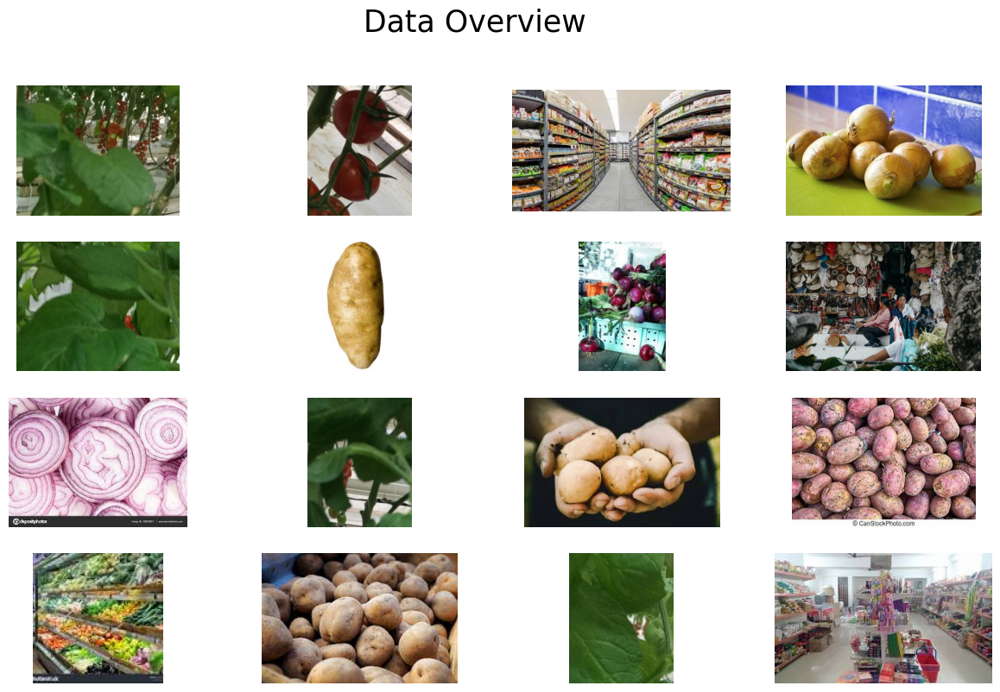

In [ ]:
train_folder='/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/'
images=[]
for folder in os.listdir(train_folder):
  for image in os.listdir(train_folder+folder):
    images.append(os.path.join(train_folder,folder,image))

fig=plt.figure(1,figsize=(15,9))
fig.suptitle('Data Overview',fontsize=25)
plt.axis('off')
n=0
for i in range(16):
  n+=1
  random_img=random.choice(images)
  imgs=tf.keras.utils.load_img(random_img)
  plt.subplot(4,4,n)
  plt.axis('off')
  plt.imshow(imgs)
plt.show()


In [ ]:
class_dir = os.listdir('/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/')
class_dir

['tomato', 'indian market', 'potato', 'onion']

In [ ]:
import random
base_dir='/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/'
class_dir = os.listdir('/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/')
class_dir
img_dict = {} #dict to store image array(key) for every class
count_dict = {} #dict to store count of files (key) for every class


for cls in class_dir:
  file_path= os.path.join(base_dir, cls)

  if os.path.exists(file_path) and os.path.isdir(file_path):
        file_paths = glob.glob(os.path.join(file_path, '*'))

  # count number of files in each class and add to count_dict
        if file_paths:
            count_dict[cls] = len(file_paths)
  # select random item from list of image path
            image_path= random.choice(file_paths)

            img_dict[cls]=tf.keras.utils.load_img(image_path)


In [ ]:
df = pd.DataFrame(data={'label':count_dict.keys(),'count':count_dict.values()})
df

,label,count
0,tomato,789
1,indian market,599
2,potato,898
3,onion,849


In [ ]:
count_dict

{'tomato': 789, 'indian market': 599, 'potato': 898, 'onion': 849}

[]

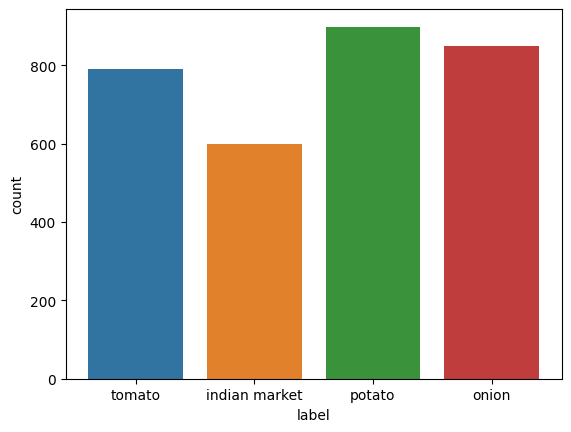

In [ ]:
sns.barplot(x=df['label'],y=df['count'],data=df)
plt.plot()

In [ ]:
import os
import glob
import random
import tensorflow as tf

base_dir_2 = '/content/drive/MyDrive/ninjacart_data/ninjacart_data/test'
class_dir_2 = os.listdir(base_dir_2)
img_dict_2 = {}  # dict to store image array (key) for every class
count_dict_2= {}  # dict to store count of files (key) for every class

for cls in class_dir_2:
    class_path = os.path.join(base_dir_2, cls)

    if os.path.exists(class_path) and os.path.isdir(class_path):
        file_paths = glob.glob(os.path.join(class_path, '*'))

        if file_paths:
            # Count the number of files in each class and add to count_dict
            count_dict_2[cls] = len(file_paths)

            # Select a random item from the list of image paths
            image_path = random.choice(file_paths)

            img_dict[cls] = tf.keras.utils.load_img(image_path)
            count_dict
        else:
            print(f"Warning: No files found in directory '{class_path}'")
    else:
        print(f"Warning: Directory '{class_path}' does not exist or is not a directory")


In [ ]:
count_dict_2

{'potato': 81, 'tomato': 106, 'indian market': 81, 'onion': 83}

In [ ]:
df_new = pd.DataFrame(data={'label':count_dict.keys(),'count':count_dict.values()})
df_new

,label,count
0,tomato,789
1,indian market,599
2,potato,898
3,onion,849


[]

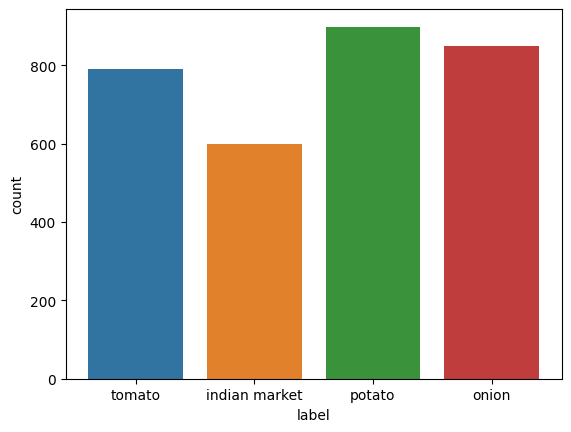

In [ ]:
sns.barplot(x=df_new['label'],y=df_new['count'],data=df_new)
plt.plot()

In [ ]:

image_size=(256,256)
train_ds=tf.keras.utils.image_dataset_from_directory('/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/',label_mode='categorical',shuffle=True, image_size=image_size,validation_split=0.2,subset='training',seed=2022)
test_ds=tf.keras.utils.image_dataset_from_directory('/content/drive/MyDrive/ninjacart_data/ninjacart_data/test/',label_mode='categorical',shuffle=False,image_size=image_size,seed=2022)
valid_ds=tf.keras.utils.image_dataset_from_directory('/content/drive/MyDrive/ninjacart_data/ninjacart_data/train/',label_mode='categorical',shuffle=True, image_size=image_size,validation_split=0.2,subset='validation',seed=2022)


Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 351 files belonging to 4 classes.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.


since label_mode='categorical' one-hot encodes the classes alphabetically
1. indian market(which we consider noise)
  =class1
2. onino=1
3. potato=2
4. tomato=3

## **Building** **CNN** **Model**

In [ ]:
# model architecture
image_size=(256,256)
model=tf.keras.Sequential(
    [
      tf.keras.layers.Rescaling(1.0/255),
      tf.keras.layers.Input(shape=(image_size[0],image_size[1],3)),

      tf.keras.layers.Conv2D(32,kernel_size=(3,3),padding='same',activation='relu'),
      tf.keras.layers.Conv2D(32,kernel_size=(3,3),padding='same',activation='relu'),
      tf.keras.layers.MaxPool2D(pool_size=(2,2)),

      tf.keras.layers.Conv2D(64,kernel_size=(3,3),padding='same',activation='relu'),
      tf.keras.layers.Conv2D(64,kernel_size=(3,3),padding='same',activation='relu'),
      tf.keras.layers.MaxPool2D(pool_size=(2,2)),

      tf.keras.layers.Conv2D(128,kernel_size=(3,3),padding='same',activation='relu'),
      # reduce dense layer parameter
      tf.keras.layers.GlobalAveragePooling2D(),
      # we have 4 classes so dense layer is 4
      tf.keras.layers.Dense(4,activation='softmax')
    ]
)


In [ ]:
model.compile(optimizer='adam',loss='CategoricalCrossentropy'
                 ,metrics=['accuracy','Precision','Recall'])

implementing tensorboard callback to plot our models metrics later and store them in our log directory

In [ ]:
from tensorflow.keras.callbacks import Callback

class YourCallback(Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Your callback logic here
        log_dir_1='logs/Custom_CNN_overfit'
        tensor_c_b=tf.keras.callbacks.TensorBoard(log_dir=log_dir_1,histogram_freq=1)

# Create an instance of your callback
tensor_c_b = YourCallback()

In [ ]:
history=model.fit(train_ds,epochs=50,validation_data=valid_ds)

Epoch 1/50
79/79 [==============================] - 454s 5s/step - loss: 1.1009 - accuracy: 0.5036 - precision: 0.7415 - recall: 0.2528 - val_loss: 0.7046 - val_accuracy: 0.7337 - val_precision: 0.8233 - val_recall: 0.6316
Epoch 2/50
79/79 [==============================] - 19s 222ms/step - loss: 0.6783 - accuracy: 0.7404 - precision: 0.7991 - recall: 0.6455 - val_loss: 0.6275 - val_accuracy: 0.7671 - val_precision: 0.8000 - val_recall: 0.6954
Epoch 3/50
79/79 [==============================] - 21s 251ms/step - loss: 0.5651 - accuracy: 0.7787 - precision: 0.8300 - recall: 0.7201 - val_loss: 0.5767 - val_accuracy: 0.7847 - val_precision: 0.8174 - val_recall: 0.7352
Epoch 4/50
79/79 [==============================] - 19s 221ms/step - loss: 0.5289 - accuracy: 0.8022 - precision: 0.8449 - recall: 0.7404 - val_loss: 0.5540 - val_accuracy: 0.7943 - val_precision: 0.8349 - val_recall: 0.7257
Epoch 5/50
79/79 [==============================] - 21s 253ms/step - loss: 0.4861 - accuracy: 0.8194 -

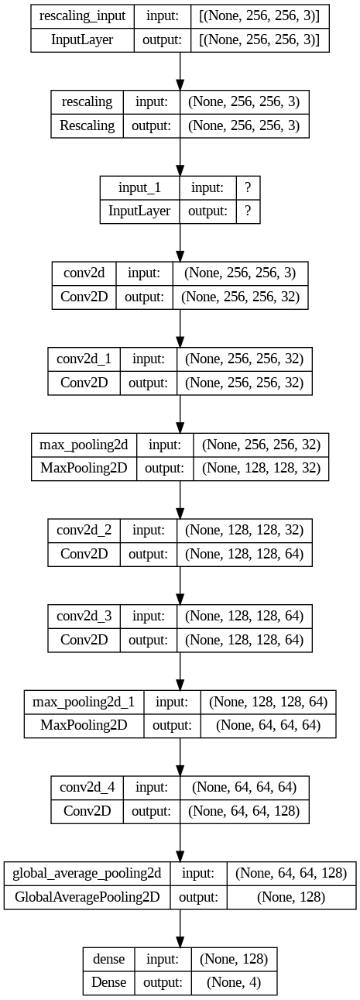

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True)

In [ ]:
epochs=history.params['epochs']
validation_loss=history.history['val_loss']
training_loss=history.history['loss']
val_accuracy =history.history['val_accuracy']
accuracy=history.history['accuracy']
# precision=history.history['precision']
# recall=history.history['recall']

In [ ]:
def plot_acc(model_history,n_epochs):

  fig,axes=plt.subplots(nrows=1,ncols=2,figsize=(15,5))
  ax=axes.ravel()
  #  accuracy_graph
  ax[0].plot(range(0,history.params['epochs']),[acc*100 for acc in history.history['accuracy']],label='Train',color='b')
  ax[0].plot(range(0,history.params['epochs']),[acc*100 for acc in history.history['val_accuracy']],label='val',color='r')
  ax[0].set_title('Accuracy vs Epochs',fontsize=15)
  ax[0].set_ylabel('Accuracy',fontsize=15)
  ax[0].set_xlabel('Epochs',fontsize=15)
  ax[0].legend()

  # loss_graph
  ax[1].plot(range(0,history.params['epochs']),history.history['loss'],label='Train',color='b')
  ax[1].plot(range(0,history.params['epochs']),history.history['val_loss'],label='val',color='r')
  ax[1].set_title('Loss vs Epochs',fontsize=15)
  ax[1].set_ylabel('Loss',fontsize=15)
  ax[1].set_xlabel('Epochs',fontsize=15)
  ax[1].legend()
  plt.show()

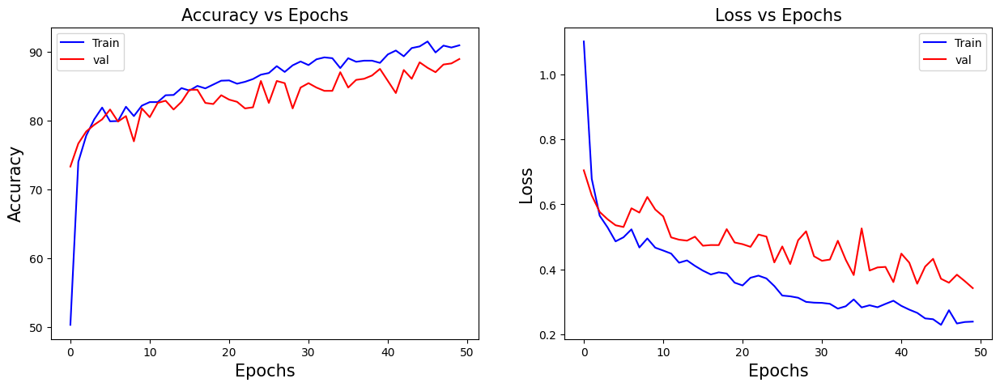

In [ ]:
plot_acc(history,n_epochs=10)

Here is not overfitting

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 input_1 (InputLayer)        multiple                  0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 64)      18496     
                                                        

### Testing model

In [ ]:
test_image=[]
for folder in os.listdir(base_dir_2):
  for image in os.listdir(base_dir_2+'/'+folder):
    test_image.append(os.path.join(base_dir_2,folder,image))

In [ ]:
class_names=['noise','onion','potato','tomato']

In [ ]:
def grid_test_model(model_name):

  fig=plt.figure(1,figsize=(17,15))
  plt.axis('off')
  n=0
  for i in range(8):
    n+=1
    img_0=tf.keras.utils.load_img(random.choice(test_image))
    img_0=tf.keras.utils.img_to_array(img_0)
    img_0=tf.image.resize(img_0,(256,256))
    img_1=tf.expand_dims(img_0,axis=0)

    pred=model_name.predict(img_1)
    predicted_label=tf.argmax(pred,1).numpy().item()

    for item in pred:
      item=tf.round((item*100))


    plt.subplot(2,4,n)
    plt.axis('off')
    plt.title(f'prediction:{class_names[predicted_label]}\n\n'
               f'{item[0]} % {class_names[0]}\n'
               f'{item[1]} % {class_names[1]}\n'
               f'{item[2]} % {class_names[2]}\n'
               f'{item[3]} % {class_names[3]}\n')
    plt.imshow(img_0/255)
  plt.show()

1/1 [==============================] - 1s 604ms/step


<ipython-input-32-e3326677af6a>:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,4,n)


1/1 [==============================] - 0s 39ms/step


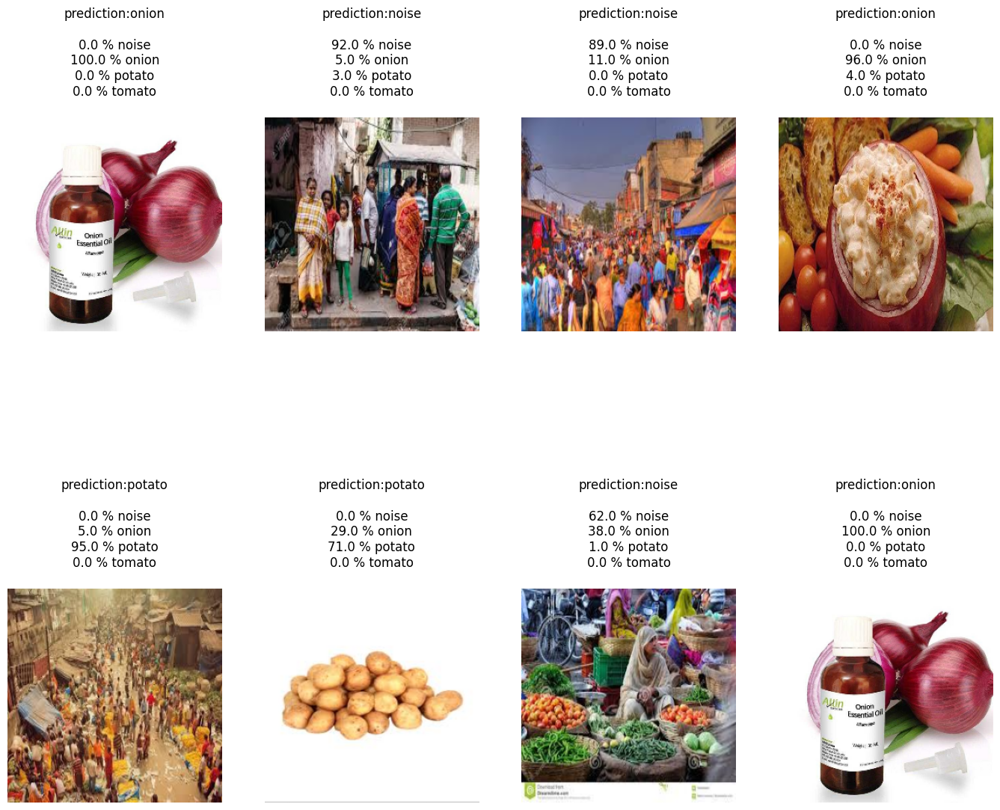

In [ ]:
grid_test_model(model)

By this we can say that our model not too sure of the correct classes

# Evaluate accuracy on each class
1. first specify the path of classes
  - we define function **classvise_accuracy ** which calculate accuracy for each class by taking in class path and model
  - Append all file paths for the input in alist

In [ ]:
tomato_path ='/content/drive/MyDrive/ninjacart_data/ninjacart_data/test/tomato'
noise_path= '/content/drive/MyDrive/ninjacart_data/ninjacart_data/test/indian market'
potato_path= '/content/drive/MyDrive/ninjacart_data/ninjacart_data/test/potato'
onion_path= '/content/drive/MyDrive/ninjacart_data/ninjacart_data/test/onion'

In [ ]:
os.listdir(noise_path)

['india-4898453__340.jpg',
 'indianmarket19.jpeg',
 'indianmarket14.jpeg',
 'indianmarket25.jpeg',
 'indianmarket34.jpeg',
 'indianmarket27.jpeg',
 'indianmarket20.jpeg',
 'indianmarket23.jpeg',
 'indianmarket33.jpeg',
 'indianmarket28.jpeg',
 'in.jpeg',
 'indianmarket35.jpeg',
 'bn.jpeg',
 'indianmarket12.jpeg',
 'indianmarket36.jpeg',
 'hjx.jpeg',
 'indianmarket15.jpeg',
 'indianmarket37.jpeg',
 'indianmarket21.jpeg',
 'indianmarket26.jpeg',
 'indianmarket18.jpeg',
 'igis.jpeg',
 'bhl.jpeg',
 'indianmarket10.jpeg',
 'indianmarket24.jpeg',
 'indianmarket31.jpeg',
 'bhv.jpeg',
 'indianmarket13.jpeg',
 'indianmarket38.jpeg',
 'indianmarket29.jpeg',
 'indianmarket30.jpeg',
 'indianmarket39.jpeg',
 'indianmarket43.jpeg',
 'indianmarket56.jpeg',
 'indianmarket69.jpeg',
 'indianmarket6.jpeg',
 'indianmarket74.jpeg',
 'indianmarket53.jpeg',
 'indianmarket57.jpeg',
 'indianmarket5.jpeg',
 'indianmarket4.jpeg',
 'indianmarket47.jpeg',
 'indianmarket59.jpeg',
 'indianmarket50.jpeg',
 'indianmar

In [ ]:
def classive_accuracy(class_path,class_names,model_name):
  path=[]
  for i in os.listdir(class_path):
    path.append(class_path+'/'+ str(i))
  correct=0
  total=0

  for i in range(len(path)):

      total+=1

      img_0=tf.keras.utils.load_img(path[i])
      img_0=tf.keras.utils.img_to_array(img_0)
      img_0=tf.image.resize(img_0,(256,256))
      img_1=tf.expand_dims(img_0,axis=0)

      pred= model_name.predict(img_1)
      if tf.argmax(pred[0])==class_names.index(f'{class_names}'):
        correct+=1


  print(f'accuracy for class {class_names} is {round((correct/total)*100,2)}% consisting of {len(path)}images')



In [ ]:
classive_accuracy(noise_path, 'noise', model)
classive_accuracy(onion_path,'onion',model)
classive_accuracy(potato_path,'potato',model)
classive_accuracy(tomato_path,'tomato',model)

1/1 [==============================] - 0s 18ms/step
accuracy for class noise is 76.54% consisting of 81images
1/1 [==============================] - 0s 18ms/step
accuracy for class onion is 1.2% consisting of 83images
1/1 [==============================] - 0s 115ms/step
accuracy for class potato is 1.23% consisting of 81images
1/1 [==============================] - 0s 17ms/step
accuracy for class tomato is 0.0% consisting of 106images


In [ ]:
result = model.evaluate(test_ds)
dict(zip(model.metrics_names,result))

11/11 [==============================] - 4s 399ms/step - loss: 0.3470 - accuracy: 0.8746 - precision: 0.8837 - recall: 0.8661


{'loss': 0.34699007868766785,
 'accuracy': 0.874643862247467,
 'precision': 0.8837209343910217,
 'recall': 0.8660968542098999}

* This make sense that our baseline CNN model has a categorical cross entropy loss of ~0.5.
* which indicate overfitting

## MODEL TUNING- SOLVING OVERFITTING

## Augmenting data
* Data augmentation introduces our model to different aspects and visualization of class images there fore increasing model generalisation
- 3 type of augmentation
   * Randomflip : flip horizontally and vertically during training
   * RandomRotation : randomly rotating imgs during training by a factor
   * RandomTranslation : randomly translate imgs during training by shifting factor

In [ ]:
augmaentation=tf.keras.Sequential([
  tf.keras.layers.RandomFlip(
    mode='horizontal_and_vertical'),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomTranslation(height_factor=0.2,width_factor=0.2)
      ])

aug_ds=train_ds
for image,label in train_ds:
  image=augmaentation(image)


# Adding Batchnormalisation and Dropout
 - Batchnormalisation() and Dropout() helps in improving its generalisation
 - Dropout() : Dropout random neuron while trainig which forces the model to focus on every feature for prediction
 - Batchnormalisation: Normalize the input from previous layers for every mini batch before senting it to the next layer(mean=0,std=1)


In [ ]:
# Applying Batchnormalization,dropout

model_2=tf.keras.Sequential(
    [
     tf.keras.layers.Rescaling(1./255),
     tf.keras.layers.InputLayer(input_shape=[image_size[0],image_size[1],3]),


    tf.keras.layers.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu'),
    tf.keras.layers.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),

    tf.keras.layers.Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'),
    tf.keras.layers.Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),

    tf.keras.layers.Conv2D(filters=128,kernel_size=3,padding='same',activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(4,activation='softmax')

    ]
)

In [ ]:
model_2.compile(optimizer='adam',loss='CategoricalCrossentropy'
                 ,metrics=['accuracy','Precision','Recall'])

## Implimenting call backs

some call backs to improve our model training process
* TensorBoard : enable visualizations for tensorboard for our models metrics
* Modelcheckpoints : saves the best model having lowerst val_loss by default
* Early Stopping : stop training when val_loss has stopped improving,after waiting patience=3

In [ ]:
# TensorBoard
log_dir_2='logs/Custom_CNN_callback'
tensor_c_b=tf.keras.callbacks.TensorBoard(log_dir=log_dir_2,histogram_freq=1)

# ModelCheckpoint
checkpoint_cb=tf.keras.callbacks.ModelCheckpoint('CNN_best.h5',save_best_only=True)

# Early stopping
early_stopping_cb=tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    # patience=3,
    verbose=0,
    restore_best_weights=True)


In [ ]:
history2=model_2.fit(train_ds,epochs=50,validation_data=valid_ds)
# callbacks=[tensor_c_b,checkpoint_cb,early_stopping_cb ]

Epoch 1/50
79/79 [==============================] - 21s 252ms/step - loss: 0.4393 - accuracy: 0.8274 - precision: 0.8584 - recall: 0.7879 - val_loss: 1.3055 - val_accuracy: 0.4896 - val_precision: 0.5017 - val_recall: 0.4833
Epoch 2/50
79/79 [==============================] - 19s 230ms/step - loss: 0.4033 - accuracy: 0.8461 - precision: 0.8747 - recall: 0.8182 - val_loss: 1.7207 - val_accuracy: 0.3222 - val_precision: 0.3443 - val_recall: 0.2663
Epoch 3/50
79/79 [==============================] - 19s 232ms/step - loss: 0.3893 - accuracy: 0.8465 - precision: 0.8716 - recall: 0.8258 - val_loss: 0.7367 - val_accuracy: 0.7209 - val_precision: 0.7734 - val_recall: 0.6858
Epoch 4/50
79/79 [==============================] - 22s 255ms/step - loss: 0.3701 - accuracy: 0.8569 - precision: 0.8785 - recall: 0.8301 - val_loss: 0.4989 - val_accuracy: 0.8022 - val_precision: 0.8404 - val_recall: 0.7560
Epoch 5/50
79/79 [==============================] - 20s 233ms/step - loss: 0.3333 - accuracy: 0.8712

In [ ]:
result_2=model_2.evaluate(test_ds)
dict(zip(model_2.metrics_names,result))

11/11 [==============================] - 2s 150ms/step - loss: 0.3007 - accuracy: 0.9174 - precision: 0.9198 - recall: 0.9145


{'loss': 0.34699007868766785,
 'accuracy': 0.874643862247467,
 'precision': 0.8837209343910217,
 'recall': 0.8660968542098999}

## confusion matrics

In [ ]:
def conf_mat(classpath,pred_list,model_name):
  noise,onion,tomato,potato=0,0,0,0
  for i in os.listdir(classpath):
      img=tf.keras.utils.load_img(classpath+'/'+str(i))
      img=tf.keras.utils.img_to_array(img)
      img=tf.image.resize(img,(256,256))
      img=tf.expand_dims(img,axis=0)

      pred=model_name.predict(img)
      predicted=tf.argmax(pred,1).numpy().item()

      if predicted==0:
        noise+=1
      elif predicted==1:
        onion+=1
      elif predicted==2:
        potato+=1
      else:
        tomato+=1
  for item in noise,onion,potato,tomato:
    pred_list.append(item)


In [ ]:
class_names

['noise', 'onion', 'potato', 'tomato']

1/1 [==============================] - 0s 18ms/step


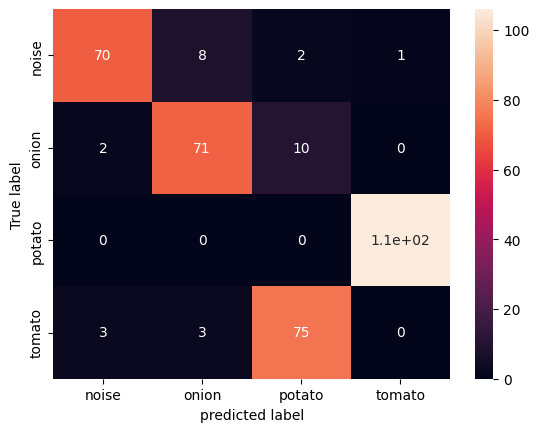

In [ ]:
l1=[]
l2=[]
l3=[]
l4=[]

conf_mat(noise_path,l1,model_2)
conf_mat(onion_path,l2,model_2)
conf_mat(tomato_path,l3,model_2)
conf_mat(potato_path,l4,model_2)

ax=sns.heatmap([l1,l2,l3,l4],xticklabels=class_names,yticklabels=class_names,annot=True)
ax.set(xlabel='predicted label',ylabel='True label')
plt.show()

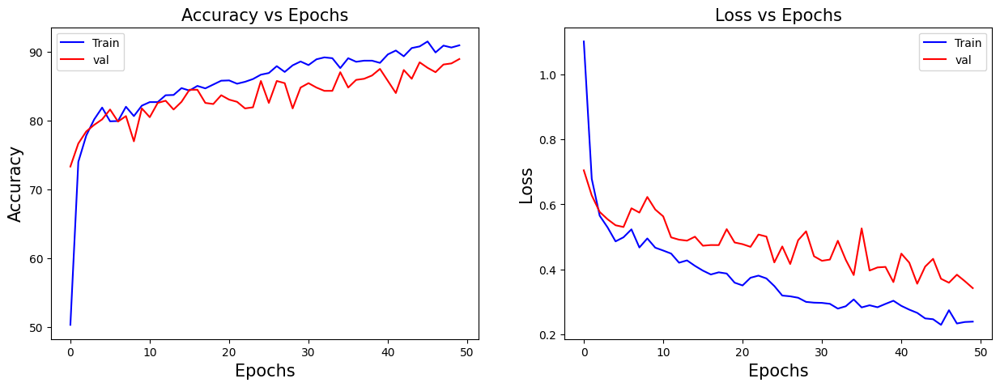

In [ ]:
plot_acc(history2,n_epochs=3)

In [ ]:
classive_accuracy(tomato_path,'tomato',model_2)
classive_accuracy(noise_path,'noise',model_2)
classive_accuracy(potato_path,'potato',model_2)
classive_accuracy(onion_path,'onion',model_2)

1/1 [==============================] - 0s 31ms/step
accuracy for class tomato is 0.0% consisting of 106images
1/1 [==============================] - 0s 18ms/step
accuracy for class noise is 86.42% consisting of 81images
1/1 [==============================] - 0s 18ms/step
accuracy for class potato is 3.7% consisting of 81images
1/1 [==============================] - 0s 18ms/step
accuracy for class onion is 2.41% consisting of 83images


1/1 [==============================] - 0s 18ms/step


<ipython-input-32-e3326677af6a>:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,4,n)


1/1 [==============================] - 0s 20ms/step


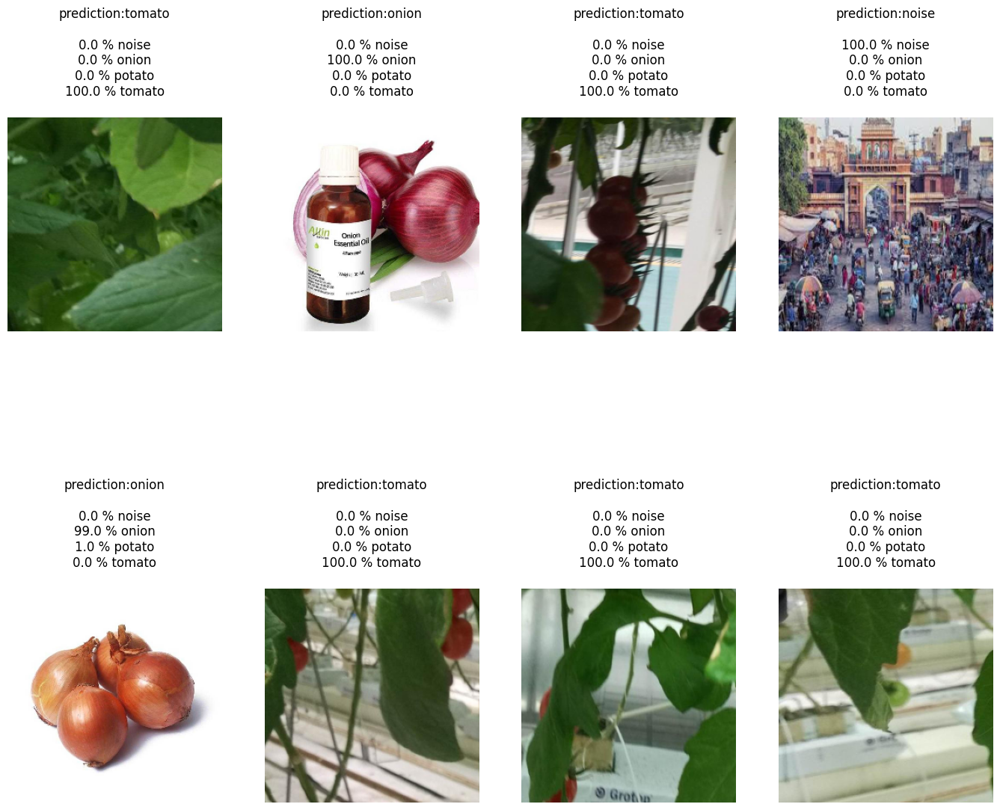

In [ ]:
grid_test_model(model_2)

## Transfer Learning

We will train 3 of the most efficient and accurate pretrainedmodels on the Imagenet data set
Models:
  - VGG-19
  -ResNet
  -MobileNet

# VGG-**19**

In [ ]:
# load_base_model
base_model_3=tf.keras.applications.vgg19.VGG19(input_shape=(256,256,3),include_top=False)

80134624/80134624 [==============================] - 1s 0us/step


In [ ]:
model_3=base_model_3.output
model_3=tf.keras.Sequential([
    # normalising 0-255 in to 0 to 1
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.InputLayer(input_shape=[image_size[0],image_size[1],3]),
    # VGG19 MODEL
    base_model_3,
    # INSTED OF DENSE DOING GlobalAveragePooling2D
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate=0.1),
    tf.keras.layers.Dense(4,activation='softmax')

])

In [ ]:
model_3.compile(optimizer='adam',loss='CategoricalCrossentropy'
                 ,metrics=['accuracy','Precision','Recall'])

In [ ]:
# TensorBoard
log_dir_3='logs/VGG19'
tensor_c_b=tf.keras.callbacks.TensorBoard(log_dir=log_dir_3,histogram_freq=1)


# ModelCheckpoint
checkpoint_cb=tf.keras.callbacks.ModelCheckpoint('VGG19',save_best_only=True)

# Early stopping
early_stopping_cb=tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    # patience=3,
    verbose=0,
    restore_best_weights=True)

In [ ]:
history3=model_3.fit(train_ds,epochs=50,validation_data=valid_ds,
                     callbacks=tensor_c_b)

Epoch 1/50
79/79 [==============================] - 104s 930ms/step - loss: 7.3650 - accuracy: 0.2667 - precision: 0.1969 - recall: 0.0100 - val_loss: 1.3828 - val_accuracy: 0.2695 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/50
79/79 [==============================] - 63s 771ms/step - loss: 1.3957 - accuracy: 0.2691 - precision: 0.3333 - recall: 0.0084 - val_loss: 1.3812 - val_accuracy: 0.2887 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/50
79/79 [==============================] - 56s 696ms/step - loss: 1.3794 - accuracy: 0.2719 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 1.3767 - val_accuracy: 0.2887 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/50
79/79 [==============================] - 55s 684ms/step - loss: 1.3737 - accuracy: 0.2835 - precision: 0.4603 - recall: 0.0116 - val_loss: 1.3803 - val_accuracy: 0.2249 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/50
79/79 [==============================] - 56s 687

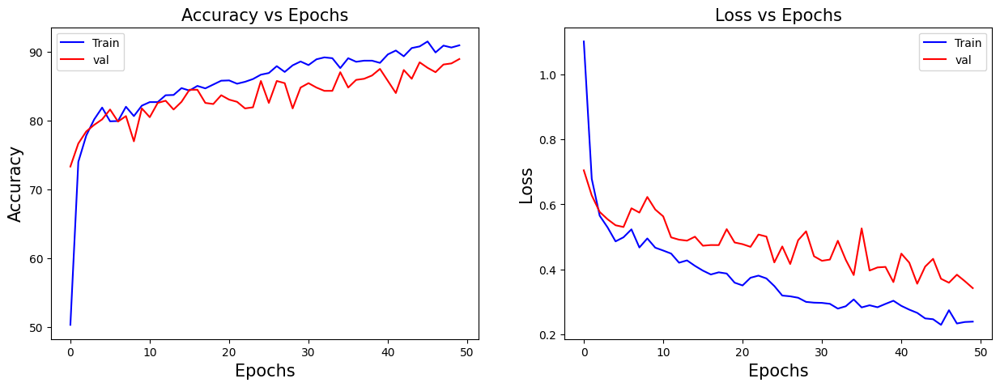

In [ ]:
plot_acc(history3,n_epochs=3)

In [ ]:
classive_accuracy(tomato_path,'tomato',model_3)
classive_accuracy(noise_path,'noise',model_3)
classive_accuracy(potato_path,'potato',model_3)
classive_accuracy(onion_path,'onion',model_3)

1/1 [==============================] - 0s 28ms/step
accuracy for class tomato is 0.0% consisting of 106images
1/1 [==============================] - 0s 17ms/step
accuracy for class noise is 0.0% consisting of 81images
1/1 [==============================] - 0s 27ms/step
accuracy for class potato is 0.0% consisting of 81images
1/1 [==============================] - 0s 19ms/step
accuracy for class onion is 0.0% consisting of 83images


In [ ]:
result_3=model_3.evaluate(test_ds)
dict(zip(model_3.metrics_name,result))

11/11 [==============================] - 8s 801ms/step - loss: 1.3962 - accuracy: 0.2308 - precision: 0.0000e+00 - recall: 0.0000e+00


1/1 [==============================] - 0s 21ms/step


<ipython-input-32-e3326677af6a>:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,4,n)


1/1 [==============================] - 0s 19ms/step


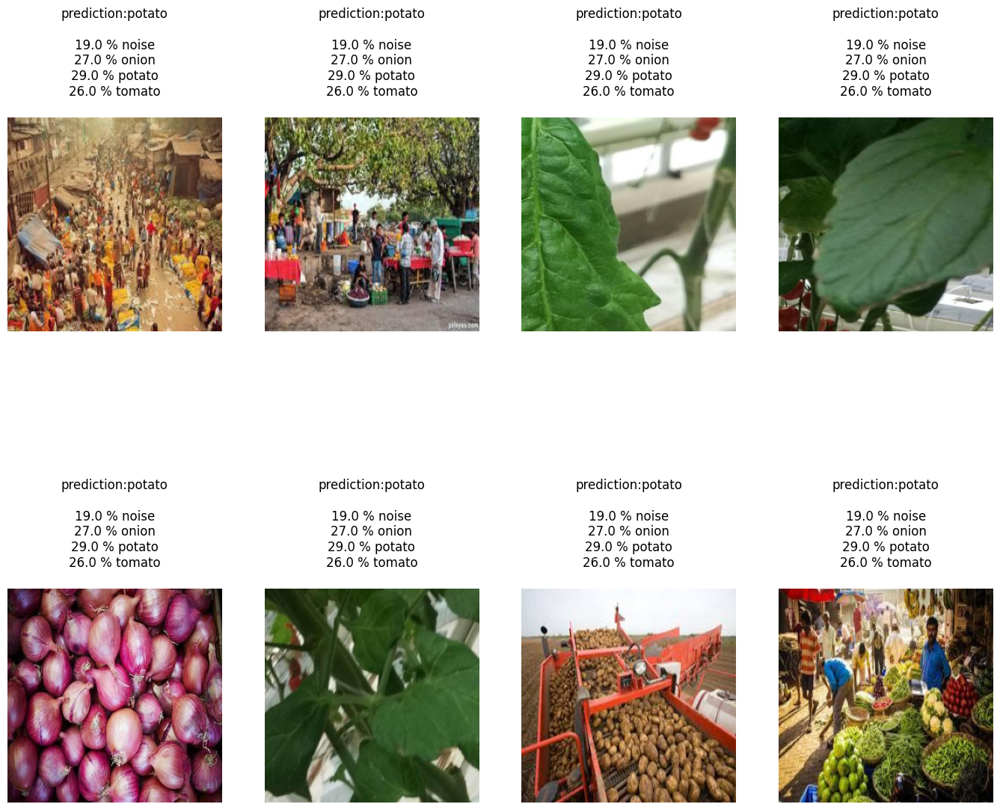

In [ ]:
grid_test_model(model_3)

## ResNet

In [ ]:
# load_base_model
base_model_4=tf.keras.applications.resnet50.ResNet50(input_shape=(256,256,3),include_top=False)

94765736/94765736 [==============================] - 2s 0us/step


In [ ]:
model_4=base_model_4.output
model_4=tf.keras.Sequential([
    # normalising 0-255 in to 0 to 1
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.InputLayer(input_shape=[image_size[0],image_size[1],3]),
    # ResNet50 MODEL
    base_model_4,
    # INSTED OF DENSE DOING GlobalAveragePooling2D
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate=0.1),
    tf.keras.layers.Dense(4,activation='softmax')

])

In [ ]:
model_4.compile(optimizer='adam',loss='CategoricalCrossentropy'
                 ,metrics=['accuracy','Precision','Recall'])

In [ ]:
# TensorBoard
log_dir_4='logs/ResNet50'
tensor_c_b=tf.keras.callbacks.TensorBoard(log_dir=log_dir_4,histogram_freq=1)


In [ ]:
history4=model_4.fit(train_ds,epochs=50,validation_data=valid_ds,
                     callbacks=tensor_c_b)

Epoch 1/50
79/79 [==============================] - 497s 5s/step - loss: 0.6351 - accuracy: 0.8541 - precision: 0.8914 - recall: 0.7891 - val_loss: 241.7591 - val_accuracy: 0.2121 - val_precision: 0.2121 - val_recall: 0.2121
Epoch 2/50
79/79 [==============================] - 43s 529ms/step - loss: 0.3250 - accuracy: 0.8967 - precision: 0.9172 - recall: 0.8740 - val_loss: 24.3729 - val_accuracy: 0.3142 - val_precision: 0.3152 - val_recall: 0.3142
Epoch 3/50
79/79 [==============================] - 43s 531ms/step - loss: 0.3182 - accuracy: 0.9011 - precision: 0.9214 - recall: 0.8784 - val_loss: 1.4047 - val_accuracy: 0.2297 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/50
79/79 [==============================] - 45s 552ms/step - loss: 0.2417 - accuracy: 0.9211 - precision: 0.9330 - recall: 0.9047 - val_loss: 1.3943 - val_accuracy: 0.2887 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5/50
79/79 [==============================] - 43s 536ms/step - loss: 0.1620 -

In [ ]:
# plot_acc(history4,n_epochs=10)

In [ ]:
classive_accuracy(tomato_path,'tomato',model_4)
classive_accuracy(noise_path,'noise',model_4)
classive_accuracy(potato_path,'potato',model_4)
classive_accuracy(onion_path,'onion',model_4)

1/1 [==============================] - 0s 22ms/step
accuracy for class tomato is 1.89% consisting of 106images
1/1 [==============================] - 0s 21ms/step
accuracy for class noise is 100.0% consisting of 81images
1/1 [==============================] - 0s 24ms/step
accuracy for class potato is 28.4% consisting of 81images
1/1 [==============================] - 0s 32ms/step
accuracy for class onion is 8.43% consisting of 83images


1/1 [==============================] - 0s 20ms/step


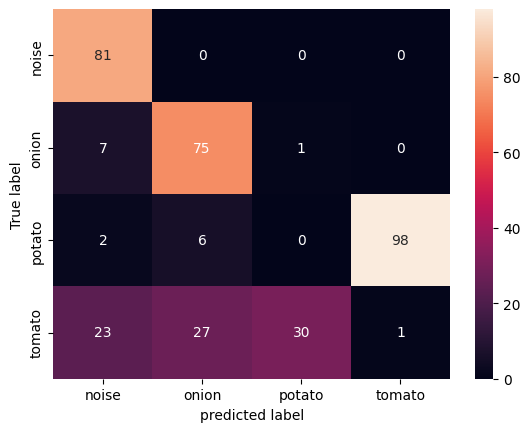

In [ ]:
l1=[]
l2=[]
l3=[]
l4=[]

conf_mat(noise_path,l1,model_4)
conf_mat(onion_path,l2,model_4)
conf_mat(tomato_path,l3,model_4)
conf_mat(potato_path,l4,model_4)

ax=sns.heatmap([l1,l2,l3,l4],xticklabels=class_names,yticklabels=class_names,annot=True)
ax.set(xlabel='predicted label',ylabel='True label')
plt.show()



In [ ]:
result_4=model_4.evaluate(test_ds)
# dict(zip(model_4.metrics_name,result))

11/11 [==============================] - 3s 292ms/step - loss: 1.1572 - accuracy: 0.8091 - precision: 0.8075 - recall: 0.8006


we acheivedd a test accuracy of 80% on our finetuned Resnetmodel

1/1 [==============================] - 0s 31ms/step


<ipython-input-42-e3326677af6a>:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,4,n)


1/1 [==============================] - 0s 30ms/step


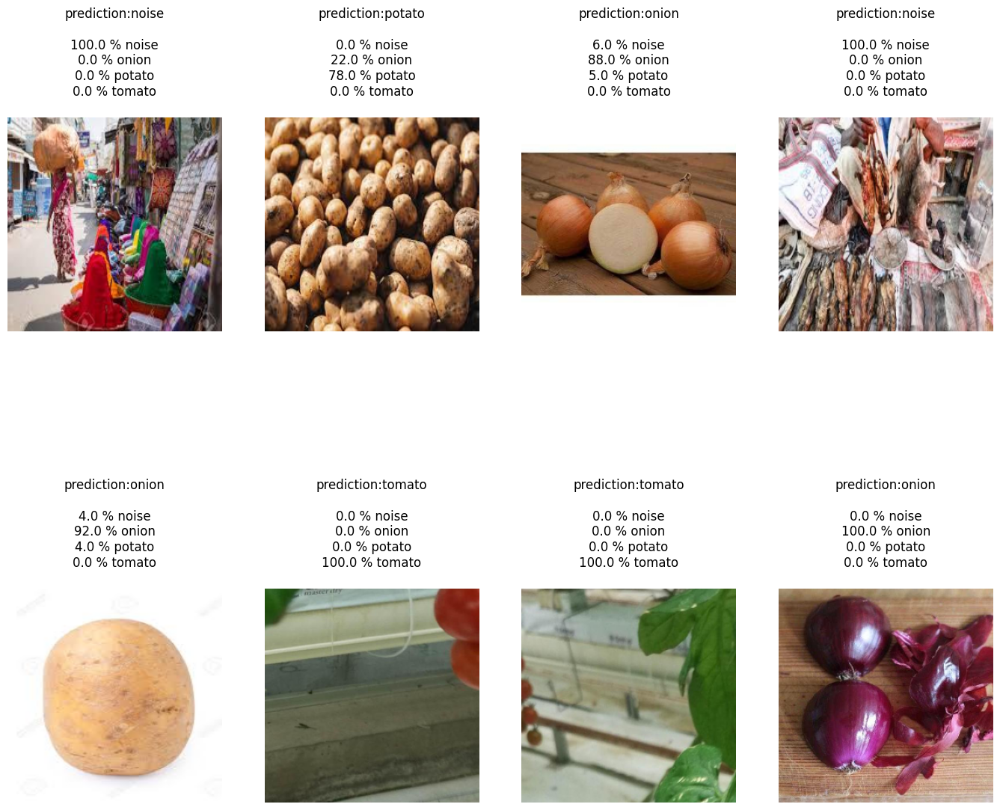

In [ ]:
grid_test_model(model_4)

## MobileNet

In [ ]:
# load_base_model
base_model_5=tf.keras.applications.mobilenet.MobileNet(input_shape=(256,256,3),include_top=False)

17225924/17225924 [==============================] - 0s 0us/step


In [ ]:
model_5=base_model_5.output
model_5=tf.keras.Sequential([
    # normalising 0-255 in to 0 to 1
    tf.keras.layers.Rescaling(1./255),
    tf.keras.layers.InputLayer(input_shape=[image_size[0],image_size[1],3]),
    # MobileNet MODEL
    base_model_5,
    # INSTED OF DENSE DOING GlobalAveragePooling2D
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(rate=0.1),
    tf.keras.layers.Dense(4,activation='softmax')

])

In [ ]:
model_5.compile(optimizer='adam',loss='CategoricalCrossentropy'
                 ,metrics=['accuracy','Precision','Recall'])

In [ ]:
# TensorBoard
log_dir_5='logs/MobileNet'
tensor_c_b=tf.keras.callbacks.TensorBoard(log_dir=log_dir_5,histogram_freq=1)


In [ ]:
history5=model_5.fit(train_ds,epochs=50,validation_data=valid_ds,
                     callbacks=tensor_c_b)

Epoch 1/50
79/79 [==============================] - 38s 277ms/step - loss: 0.3624 - accuracy: 0.8983 - precision: 0.9052 - recall: 0.8947 - val_loss: 2.6502 - val_accuracy: 0.6523 - val_precision: 0.6523 - val_recall: 0.6523
Epoch 2/50
79/79 [==============================] - 23s 279ms/step - loss: 0.1420 - accuracy: 0.9569 - precision: 0.9595 - recall: 0.9541 - val_loss: 1.3207 - val_accuracy: 0.8389 - val_precision: 0.8389 - val_recall: 0.8389
Epoch 3/50
79/79 [==============================] - 21s 250ms/step - loss: 0.0852 - accuracy: 0.9721 - precision: 0.9732 - recall: 0.9701 - val_loss: 0.2084 - val_accuracy: 0.9426 - val_precision: 0.9441 - val_recall: 0.9426
Epoch 4/50
79/79 [==============================] - 21s 248ms/step - loss: 0.1032 - accuracy: 0.9673 - precision: 0.9707 - recall: 0.9645 - val_loss: 1.5205 - val_accuracy: 0.8070 - val_precision: 0.8083 - val_recall: 0.8070
Epoch 5/50
79/79 [==============================] - 23s 273ms/step - loss: 0.0481 - accuracy: 0.9844

In [ ]:
history5

In [ ]:
# plot_acc(history5,n_epochs=3)

In [ ]:
classive_accuracy(tomato_path,'tomato',model_5)
classive_accuracy(noise_path,'noise',model_5)
classive_accuracy(potato_path,'potato',model_5)
classive_accuracy(onion_path,'onion',model_5)

1/1 [==============================] - 0s 19ms/step
accuracy for class tomato is 1.89% consisting of 106images
1/1 [==============================] - 0s 18ms/step
accuracy for class noise is 98.77% consisting of 81images
1/1 [==============================] - 0s 55ms/step
accuracy for class potato is 2.47% consisting of 81images
1/1 [==============================] - 0s 20ms/step
accuracy for class onion is 0.0% consisting of 83images


1/1 [==============================] - 0s 17ms/step


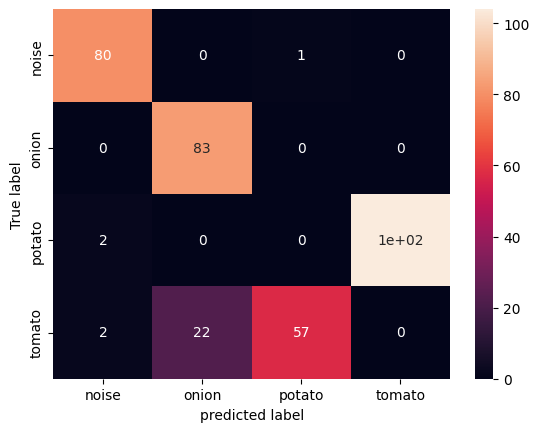

In [ ]:
l1=[]
l2=[]
l3=[]
l4=[]

conf_mat(noise_path,l1,model_5)
conf_mat(onion_path,l2,model_5)
conf_mat(tomato_path,l3,model_5)
conf_mat(potato_path,l4,model_5)

ax=sns.heatmap([l1,l2,l3,l4],xticklabels=class_names,yticklabels=class_names,annot=True)
ax.set(xlabel='predicted label',ylabel='True label')
plt.show()

In [ ]:
result_5=model_5.evaluate(test_ds)
# dict(zip(model_5.metrics_name,result))

11/11 [==============================] - 3s 247ms/step - loss: 0.3130 - accuracy: 0.9231 - precision: 0.9231 - recall: 0.9231


<ipython-input-42-e3326677af6a>:20: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,4,n)


1/1 [==============================] - 0s 31ms/step


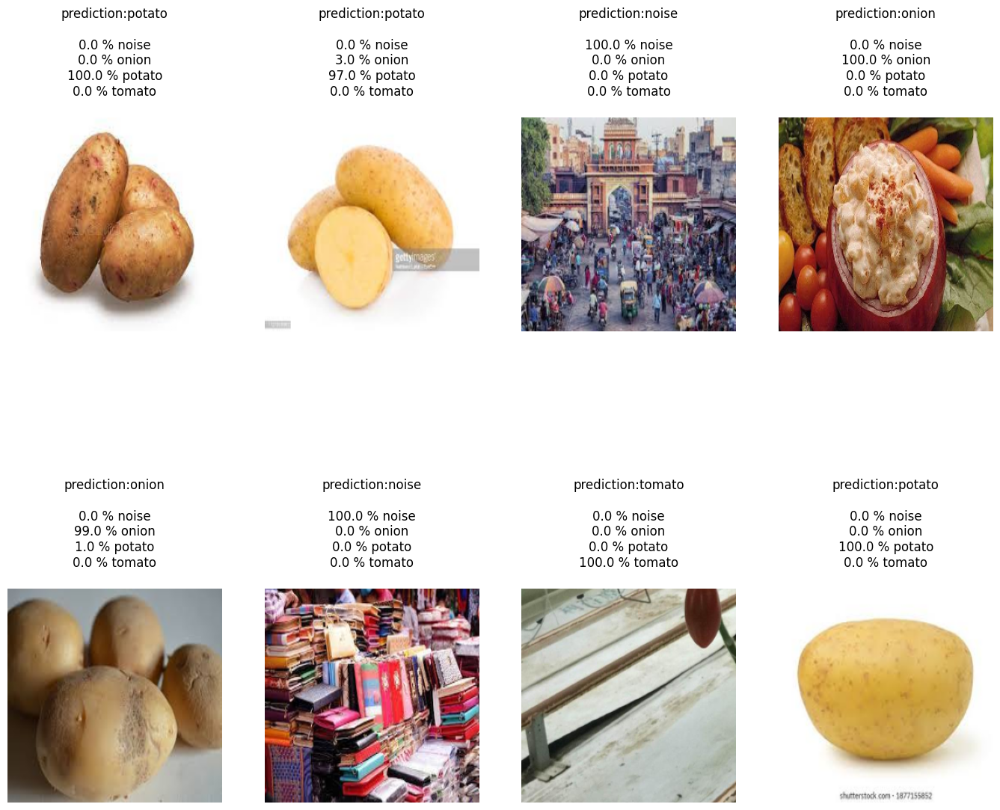

In [ ]:
grid_test_model(model_5)

In [ ]:
from keras.api._v2.keras.callbacks import TensorBoard
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>